# Using Alphalens to Analyze Kalman Filter Spread Returns

## Using Clusters from Generated via Affinity Propogation on 2013 Data

#### By Kenny Potts

I have constructed and refined a kalman filtered cointegration z-score factor for pairs trading. The second step was to create a way to at any point in time, dynamically narrow the universe of potential pairs to trade. My current method for achieving this is to use clustering on a universe of 500 stocks. I ran this clustering model in a Quantopian research notebook so that I could have access to Morningstar fundamental data for clustering features as well. Tommy's method, which is not shown here, is to use a logistic regression and a random forest model to learn the cointegrated and non-cointegrated pair features. I will import in my clusters from a txt file which I have created using daily price variation, which is similar to this Sklearn clustering example found [here](http://scikit-learn.org/stable/auto_examples/applications/plot_stock_market.html).

In [70]:
import numpy as np
import pandas as pd

from statsmodels.tsa.stattools import coint

import matplotlib.pyplot as plt
%matplotlib inline

import pandas_datareader.data as web
import scipy as sp
from scipy import stats
from matplotlib import style
import seaborn

from pykalman import KalmanFilter

import alphalens as al

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# style.use('seaborn-poster')
style.use('seaborn-whitegrid')
# style.use('seaborn-notebook')

Let's read in the clusters and the symbols

In [4]:
f = open('stock_clusters_2013_unlabeled.txt','r')
read_in = f.read()
lines = read_in.split('\n')
clusters_list = [line.replace(' ','').split(',') for line in lines]
all_symbols = read_in.replace('\n',',').replace(' ','').split(',')

In [5]:
clusters_list[1]

['EIX',
 'DD',
 'APC',
 'EA',
 'WLL',
 'AVP',
 'BDX',
 'DAL',
 'SWN',
 'SYY',
 'GWW',
 'TOL',
 'HCP',
 'CMA',
 'WYN',
 'BIIB',
 'INTC',
 'ATVI']

These clusters where generated from 2013 data, so I will bring in the 2013 to 2015 data. This way we can test for cointegration on the 2013 data, and test our factor model on the 2014 data.

In [6]:
# prices_test = web.DataReader(all_symbols, data_source='yahoo',
#                         start='2013-01-01', end='2015-01-01')

In [7]:
# prices = prices_test

This was a large amount of data, which takes a while to download, so I am going to store it on my disk using HDF5 so that I can rapidly access it without redownloading.

In [8]:
# with pd.HDFStore('stock_data.h5') as store:
#     store['clusters_pricing'] = prices
with pd.HDFStore('stock_data.h5') as store:
    prices = store['clusters_pricing']

In [9]:
prices

<class 'pandas.core.panel.Panel'>
Dimensions: 6 (items) x 523 (major_axis) x 417 (minor_axis)
Items axis: Open to Adj Close
Major_axis axis: 2013-01-01 00:00:00 to 2015-01-01 00:00:00
Minor_axis axis: A to ZNGA

## A bit of cleaning

I will only be looking at the adjusted closing prices.

In [10]:
prices_close = prices['Adj Close']

In [11]:
prices_close.head()

,A,AAPL,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,...,WYNN,X,XEL,XLNX,XOM,XRX,YHOO,YUM,ZBH,ZNGA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,28.676587,71.763763,40.902192,29.095192,62.429150,38.340000,39.100062,25.805151,46.500870,148.320458,...,103.391104,24.861977,23.422606,33.434384,77.706463,4.242482,20.080000,43.901988,65.215838,2.39
2013-01-03,28.779297,70.857944,40.817547,30.202717,62.203154,37.750000,38.469130,25.598134,46.684038,149.514677,...,104.503210,24.410640,23.354169,33.371284,77.566313,4.242482,19.780001,44.176539,66.150246,2.41
2013-01-04,29.347625,68.884221,41.090288,30.021155,62.546672,38.130001,37.784879,26.300191,47.098159,150.370526,...,105.764187,24.679523,23.439716,32.902535,77.925453,4.195277,19.860001,44.660274,66.487402,2.63
2013-01-07,29.135359,68.479021,41.221961,30.266263,62.275474,37.939999,37.900403,25.211101,46.914988,153.664543,...,106.123217,24.689124,23.191632,32.767318,77.023215,4.266084,19.400000,44.379185,66.651170,2.62


I am going to clean this data a little by dropping rows where all values are NAN.

In [12]:
prices_close.shape

(523, 417)

In [13]:
prices_close.dropna(axis=1,thresh=400).head()

,A,AAPL,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,...,WYNN,X,XEL,XLNX,XOM,XRX,YHOO,YUM,ZBH,ZNGA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,28.676587,71.763763,40.902192,29.095192,62.429150,38.340000,39.100062,25.805151,46.500870,148.320458,...,103.391104,24.861977,23.422606,33.434384,77.706463,4.242482,20.080000,43.901988,65.215838,2.39
2013-01-03,28.779297,70.857944,40.817547,30.202717,62.203154,37.750000,38.469130,25.598134,46.684038,149.514677,...,104.503210,24.410640,23.354169,33.371284,77.566313,4.242482,19.780001,44.176539,66.150246,2.41
2013-01-04,29.347625,68.884221,41.090288,30.021155,62.546672,38.130001,37.784879,26.300191,47.098159,150.370526,...,105.764187,24.679523,23.439716,32.902535,77.925453,4.195277,19.860001,44.660274,66.487402,2.63
2013-01-07,29.135359,68.479021,41.221961,30.266263,62.275474,37.939999,37.900403,25.211101,46.914988,153.664543,...,106.123217,24.689124,23.191632,32.767318,77.023215,4.266084,19.400000,44.379185,66.651170,2.62


In [14]:
prices_close = prices_close.drop(prices_close.index[prices_close.isnull().sum(axis=1)>400])

In [15]:
prices_close.columns

Index(['A', 'AAPL', 'ABC', 'ABT', 'ACN', 'ADBE', 'ADI', 'ADM', 'ADP', 'ADS',
       ...
       'WYNN', 'X', 'XEL', 'XLNX', 'XOM', 'XRX', 'YHOO', 'YUM', 'ZBH', 'ZNGA'],
      dtype='object', length=417)

In [16]:
no_data_pairs = prices_close.columns[prices_close.isnull().sum(axis=0) > 0]

In [17]:
prices_close = prices_close.drop(prices_close.columns[prices_close.isnull().sum(axis=0) > 0], axis=1)

In [18]:
prices_close.columns[prices_close.isnull().sum(axis=0) > 0]

Index([], dtype='object')

we should remove the assets with no data form our clusters list.

In [19]:
new_list = []
for cluster in clusters_list:
    new_cluster = []
    for asset in cluster:
        if asset not in no_data_pairs:
            new_cluster.append(asset)
    if len(new_cluster) > 1:
        new_list.append(new_cluster)

In [20]:
clusters_list = new_list

### Isolate our cointegration training data
We will only use 2013 prices to test for cointegration.

In [21]:
prices_close.index[250:260]

DatetimeIndex(['2013-12-30', '2013-12-31', '2014-01-02', '2014-01-03',
               '2014-01-06', '2014-01-07', '2014-01-08', '2014-01-09',
               '2014-01-10', '2014-01-13'],
              dtype='datetime64[ns]', name='Date', freq=None)

In [22]:
prices_close.loc[:'2014-01-02',:].shape

(253, 396)

In [23]:
prices_close_train = prices_close.loc[:'2014-01-02',:]

## Extract cointegrated pairs within clusters

In [24]:
def find_cointegrated_pairs(data, cutoff=0.05):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    p_value_matrix = np.zeros((n, n))
    keys = data.keys()
    pairs = []
    for i in range(n):
        for j in range(i+1, n):
            s1 = data[keys[i]]
            s2 = data[keys[j]]
            result = coint(s1, s2)
            score = result[0]
            p_value = result[1]
            score_matrix[i, j] = score
            p_value_matrix[i, j] = p_value
            if p_value < cutoff:
                pairs.append((keys[i], keys[j]))
    return score_matrix, p_value_matrix, pairs

We will use this function to test for cointegration among pairs cluster by cluster.

Let's try it on a single cluster.

[('SYK', 'CELG'), ('UAL', 'TDC')]


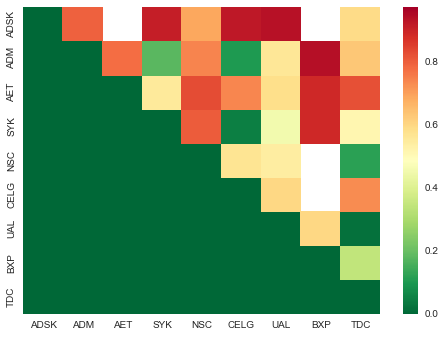

In [25]:
# Heatmap to show the p-values of the cointegration test between each pair of
# stocks. Only show the value in the upper-diagonal of the heatmap
cluster_num = 3

scores, p_values, pairs = find_cointegrated_pairs(prices_close_train.loc[:,clusters_list[cluster_num]],cutoff=0.1)

seaborn.heatmap(p_values, xticklabels=prices_close_train.loc[:,clusters_list[cluster_num]].columns.tolist(),
                yticklabels=prices_close_train.loc[:,clusters_list[cluster_num]].columns.tolist(),
                cmap='RdYlGn_r',
                mask=(p_values >= 0.95))

print(pairs)

There are two pairs within this cluster that are cointegrated. Let's run this for all of our clusters.

In [71]:
cointegrated_pairs = []
for cluster in clusters_list:
    scores, p_values, pairs = find_cointegrated_pairs(prices_close_train.loc[:,cluster],cutoff=0.1)
    cointegrated_pairs.extend(pairs)

In [72]:
cointegrated_pairs[:5]

[('EIX', 'DD'), ('EIX', 'EA'), ('EIX', 'WLL'), ('EIX', 'DAL'), ('EIX', 'HCP')]

In [73]:
len(cointegrated_pairs)

113

Let's plot some of these pairs to make sure everything is going as planned.

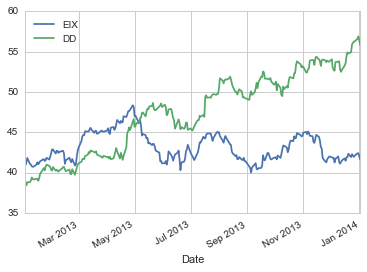

In [74]:
prices_close_train.loc[:,cointegrated_pairs[0]].plot();

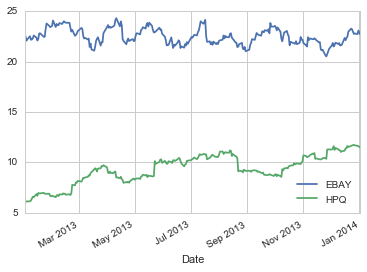

In [75]:
prices_close_train.loc[:,cointegrated_pairs[27]].plot();

# Analyzing Kalman Spread Z-scores as a factor with Alphalens

### In Sample

We will use alphalens to analyze the predictive ability of our kalman beta spread z-score factor. **We will first test using our in sample period of 2013.**

We are trading the spreads themselves, so I will construct a pandas dataframe that uses the spreads as the asset prices.

Here I have my code which calculates the spreads between assets using a kalman filter to determing a dynamic beta over the period.

In [76]:
def get_spread_dataframe(data, pairs):
    spreads = pd.DataFrame(np.zeros((data.shape[0], len(pairs))),
             index=data.index,
             columns=pairs)
    
    # calculate kalman betas and spreads
    for pair in spreads.columns:
        asset_1 = data[pair[0]]
        asset_2 = data[pair[1]]
        
        delta = 1e-7 # dictates the amount of change from period to period
                     # In our case, less change is better (more stable) so
                     # using a smaller delta here is preferable (1e-7,1e-8,1e-9...)
        trans_cov = delta / (1 - delta) * np.eye(2) # How much random walk wiggles
        obs_mat = np.expand_dims(np.vstack([[asset_1.values], [np.ones(len(asset_1))]]).T, axis=1)

        # construct kalman filter for spread beta
        kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, # y is 1-dimensional ,(alpha, beta) is 2-dimensional
                          initial_state_mean=[0,0],
                          initial_state_covariance=np.ones((2, 2)),
                          transition_matrices=np.eye(2),
                          observation_matrices=obs_mat,
                          observation_covariance=2,
                          transition_covariance=trans_cov)
        # Use the obsercations y to get running estimates and errors for the state parameters
        state_means, state_covs = kf.filter(asset_2.values)
        if state_means[-1,0] > 0: 
                            # add to the spread to simulate tradable spread and position size of spread trade
                            # necessary to properly use spreads as asset in alphalens
            spreads[pair] = (asset_2 - state_means[:,0] * asset_1) + asset_2[0]
        else:
            spreads[pair] = (asset_2 - state_means[:,0] * asset_1) + asset_1[0]
    
    return spreads

Next we want to filter the spreads with a kalman filter, and also get our z-score factor.

In [77]:
def get_kal_filtered_spreads_and_z_scores(spreads, window=30):
    kalman_spreads = spreads.copy()
    kal_spread_z_scores = spreads.copy()
    
    for pair in spreads.columns:
        spread = spreads[pair]
        
        # Construct a Kalman Filter to filter spread
        kf = KalmanFilter(transition_matrices = [1],
                          observation_matrices = [1],
                          initial_state_mean = 0,
                          initial_state_covariance = 1,
                          observation_covariance = 1,
                          transition_covariance = 0.1)

        # Use the observed values of the price to get a rolling mean
        state_means, _ = kf.filter(spread.values)

        kalman_spread = pd.Series(state_means.flatten(), index=spread.index)
        # Get the 30 day moving average
        # used as mean to calculate rolling z-scores
        spread_mavg = spread.rolling(window=window).mean()
        
        std_rolling = spread.rolling(window=window).std()
        
        zscore_kalman_spread = (kalman_spread - spread_mavg)/std_rolling
        
        kalman_spreads[pair] = kalman_spread
        kal_spread_z_scores[pair] = zscore_kalman_spread
        
    return kalman_spreads, kal_spread_z_scores

In [78]:
spreads_1 = get_spread_dataframe(prices_close_train, cointegrated_pairs)

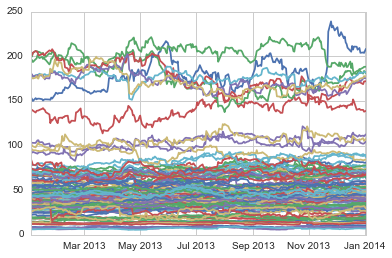

In [79]:
plt.plot(spreads_1);

In [80]:
lookback_window = 40

In [81]:
kal_spreads, kal_spread_zscores = \
get_kal_filtered_spreads_and_z_scores(spreads_1,window=lookback_window)

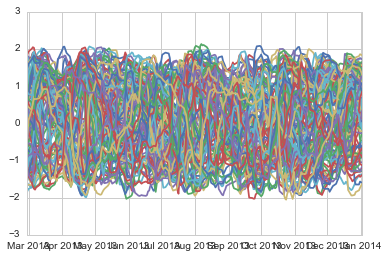

In [82]:
plt.plot(kal_spread_zscores);

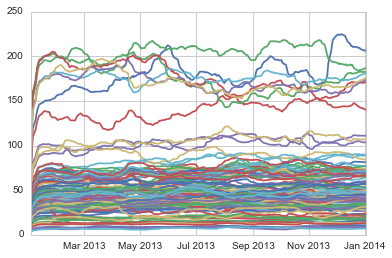

In [83]:
plt.plot(kal_spreads);

In [84]:
kal_spread_zscores_factor = kal_spread_zscores.stack()[lookback_window:]#remove nans and stack

I will feed alpha lends our negated z-score because we wish to short high z-score and long lower z-scores.

In [85]:
kalman_spread_zscore_factor_data =\
al.utils.get_clean_factor_and_forward_returns(kal_spread_zscores_factor*(-1), 
                                              prices=(spreads_1.iloc[lookback_window:]),
                                              quantiles=4,
                                              periods=(1,2,3,4,5,10, 20, 30),
                                              bins=None)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-2.128718,-0.350185,-1.304928,0.306978,5307,25.663717
2,-1.351496,0.484754,-0.529047,0.327160,5124,24.778761
3,-0.813159,1.182120,0.319582,0.355985,5124,24.778761
4,0.331183,2.055317,1.188116,0.320465,5124,24.778761


Returns Analysis


,1,2,3,4,5,10,20,30
Ann. alpha,0.570,0.578,0.567,0.545,0.521,0.470,0.422,0.277
beta,-0.031,-0.086,-0.048,0.033,0.111,0.322,0.412,0.691
Mean Period Wise Return Top Quantile (bps),20.480,41.748,64.098,84.608,104.867,212.928,407.572,491.961
Mean Period Wise Return Bottom Quantile (bps),-16.520,-33.487,-49.969,-65.168,-82.376,-170.761,-319.641,-385.524
Mean Period Wise Spread (bps),37.000,37.589,37.962,37.364,37.366,38.263,36.200,29.093


Information Analysis


,1,2,3,4,5,10,20,30
IC Mean,0.074,0.099,0.123,0.142,0.158,0.229,0.326,0.352
IC Std.,0.199,0.202,0.196,0.189,0.190,0.161,0.121,0.139
t-stat(IC),4.999,6.651,8.508,10.205,11.243,19.240,36.627,34.366
p-value(IC),0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,-0.215,-0.007,-0.087,-0.218,-0.277,-0.385,-0.008,0.172
IC Kurtosis,-0.341,-0.710,-0.491,-0.475,-0.569,0.201,-0.095,-0.478
Ann. IR,5.867,7.805,9.984,11.975,13.193,22.578,42.981,40.327


Turnover Analysis


,1,2,3,4,5,10,20,30
Quantile 1 Mean Turnover,0.088,0.160,0.226,0.286,0.342,0.566,0.785,0.835
Quantile 2 Mean Turnover,0.191,0.337,0.452,0.540,0.600,0.720,0.776,0.777
Quantile 3 Mean Turnover,0.187,0.332,0.447,0.531,0.593,0.735,0.785,0.751
Quantile 4 Mean Turnover,0.087,0.159,0.223,0.280,0.333,0.550,0.800,0.849


,1,2,3,4,5,10,20,30
Mean Factor Rank Autocorrelation,0.981,0.942,0.89,0.831,0.768,0.449,-0.037,-0.224


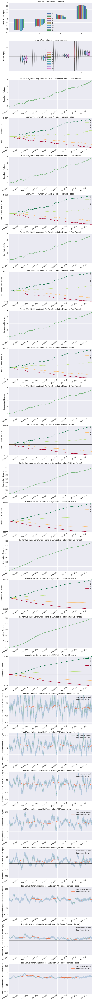

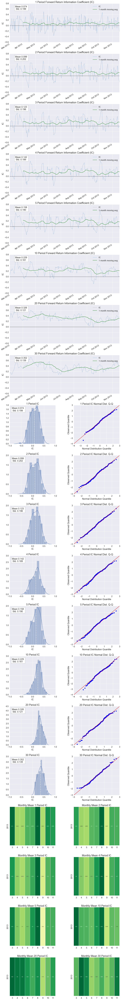

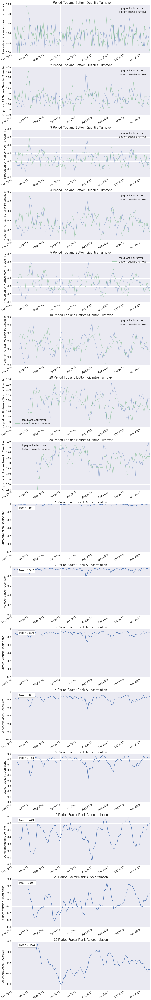

In [86]:
al.tears.create_full_tear_sheet(kalman_spread_zscore_factor_data)

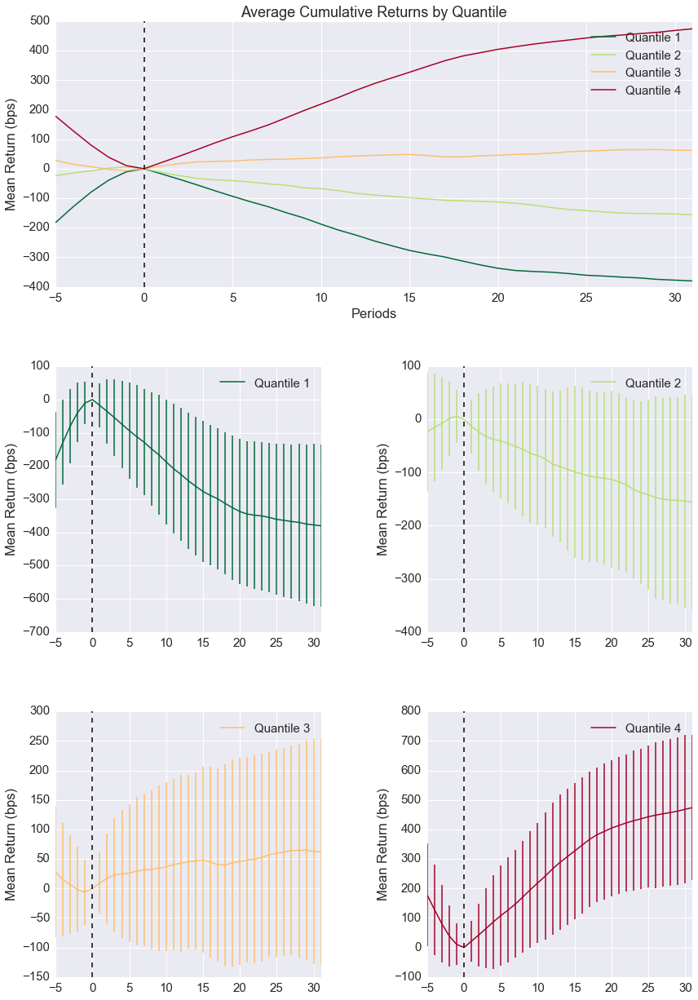

In [44]:
al.tears.create_event_returns_tear_sheet(kalman_spread_zscore_factor_data,
                                         prices=(spreads_1.iloc[lookback_window:]))

## Running Alphalens on Out of Sample Pricing data

This will be the true test of the z-score factor's predictive ability.

Let's get our testing data.

In [87]:
lookback_window = 40
idx_2014 = np.arange(prices_close.shape[0])[prices_close.index == '2014-01-02'][0]
idx_2014

252

In [88]:
prices_close_test = prices_close.iloc[idx_2014 - lookback_window:,:]

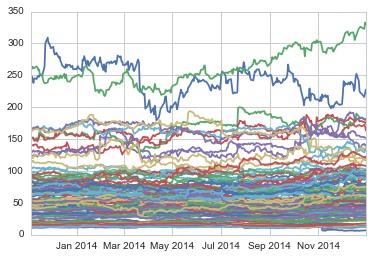

In [89]:
spreads_test = get_spread_dataframe(prices_close_test, cointegrated_pairs)
plt.plot(spreads_test);

In [90]:

kal_spreads_test, kal_spread_zscores_test = \
get_kal_filtered_spreads_and_z_scores(spreads_test,window=lookback_window)

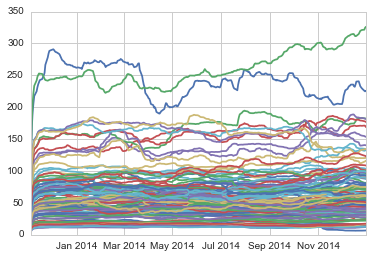

In [91]:
plt.plot(kal_spreads_test);

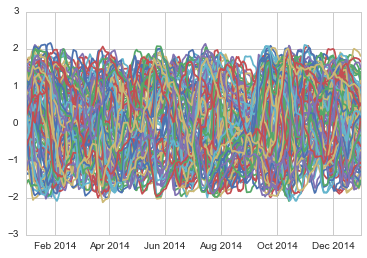

In [92]:
plt.plot(kal_spread_zscores_test);

In [93]:
kal_spread_zscores_factor_test = kal_spread_zscores_test.stack()[lookback_window:]#remove nans and stack

Once again, I will feed alpha lends our negated z-score because we wish to short high z-score and long lower z-scores.

In [94]:
kalman_spread_zscore_factor_data_test =\
al.utils.get_clean_factor_and_forward_returns(kal_spread_zscores_factor_test*(-1), 
                                              prices=(spreads_test.iloc[lookback_window:]),
                                              quantiles=4,
                                              periods=(1,2,3,4,5,10, 20, 30),
                                              bins=None)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-2.157045,-0.337416,-1.299786,0.328903,6438,25.663717
2,-1.355137,0.536941,-0.484221,0.360499,6216,24.778761
3,-0.677454,1.274536,0.400324,0.379901,6216,24.778761
4,0.193706,2.125878,1.264242,0.350335,6216,24.778761


Returns Analysis


,1,2,3,4,5,10,20,30
Ann. alpha,0.252,0.249,0.257,0.259,0.261,0.246,0.199,0.195
beta,0.278,0.316,0.277,0.258,0.245,0.229,0.060,-0.102
Mean Period Wise Return Top Quantile (bps),10.712,20.906,30.980,41.328,50.940,100.307,180.549,266.311
Mean Period Wise Return Bottom Quantile (bps),-10.627,-20.869,-31.187,-41.475,-52.022,-96.233,-146.068,-191.564
Mean Period Wise Spread (bps),21.340,20.879,20.711,20.693,20.582,19.636,16.336,15.254


Information Analysis


,1,2,3,4,5,10,20,30
IC Mean,0.049,0.072,0.086,0.096,0.104,0.143,0.166,0.187
IC Std.,0.186,0.183,0.175,0.172,0.165,0.153,0.167,0.197
t-stat(IC),3.966,5.820,7.338,8.283,9.404,13.969,14.780,14.145
p-value(IC),0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,0.015,-0.081,-0.099,-0.001,0.081,-0.283,-0.075,-0.118
IC Kurtosis,-0.309,0.053,0.265,0.039,0.052,0.308,0.630,-0.396
Ann. IR,4.226,6.201,7.818,8.825,10.019,14.883,15.747,15.070


Turnover Analysis


,1,2,3,4,5,10,20,30
Quantile 1 Mean Turnover,0.083,0.155,0.217,0.274,0.326,0.523,0.731,0.786
Quantile 2 Mean Turnover,0.183,0.324,0.433,0.517,0.580,0.721,0.778,0.766
Quantile 3 Mean Turnover,0.181,0.318,0.422,0.502,0.563,0.712,0.769,0.762
Quantile 4 Mean Turnover,0.084,0.153,0.213,0.268,0.317,0.519,0.745,0.835


,1,2,3,4,5,10,20,30
Mean Factor Rank Autocorrelation,0.982,0.945,0.897,0.841,0.783,0.499,0.099,-0.131


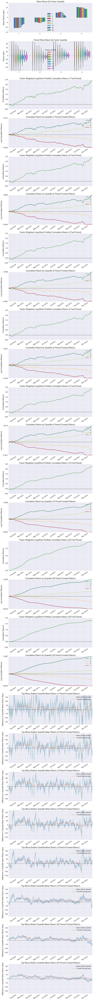

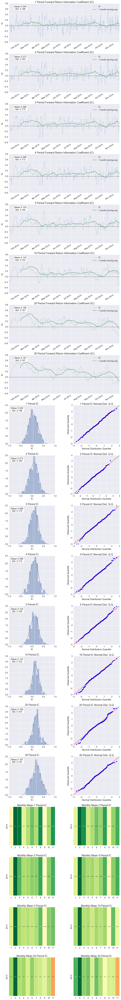

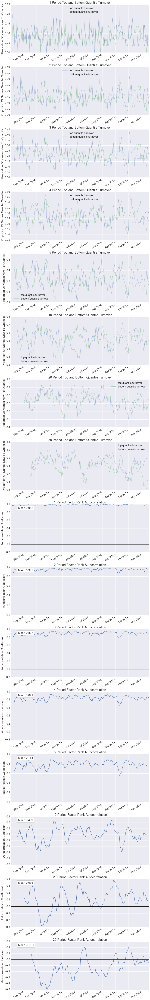

In [95]:
al.tears.create_full_tear_sheet(kalman_spread_zscore_factor_data_test)

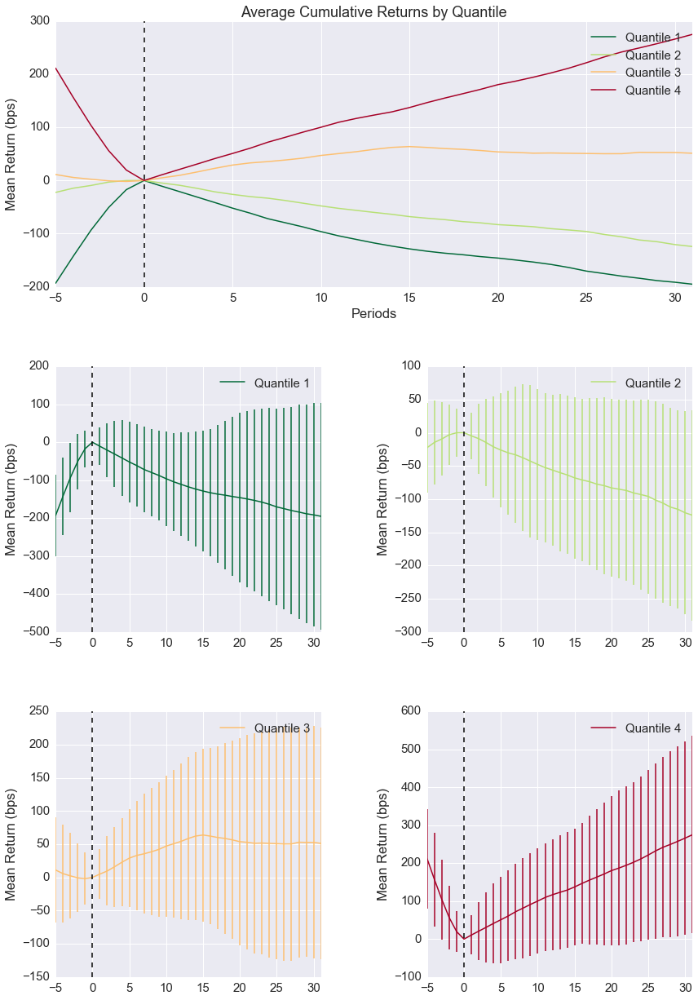

In [96]:
al.tears.create_event_returns_tear_sheet(kalman_spread_zscore_factor_data_test,
                                         prices=(spreads_test.iloc[lookback_window:]))

## We have positive returns!
Note that we also have a fairly low beta, hovering around 0 to 0.2.

The next step is to implement this method for live trading on our platform of choice. When we implement this, we should consider only entering positions within the $1^{st}$ and $4^{th}$ quantiles, and then rebalancing the portfolio every 10 to 20 days instead of just having a naive factor weighted portfolio. We may also consider doing factor percentiles rather than quantiles.